In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!git clone https://github.com/mannadamay12/tile2net-segD
%cd tile2net-segD

Cloning into 'tile2net-segD'...
remote: Enumerating objects: 2355, done.
remote: Counting objects: 100% (1173/1173), done.
remote: Compressing objects: 100% (318/318), done.
remote: Total 2355 (delta 973), reused 870 (delta 853), pack-reused 1182 (from 2)
Receiving objects: 100% (2355/2355), 31.04 MiB | 36.41 MiB/s, done.
Resolving deltas: 100% (1445/1445), done.
/content/tile2net-segD


In [ ]:
!python --version

Python 3.11.13


In [ ]:
!git clone https://github.com/mannadamay12/tile2net-segD
%cd tile2net-segD

fatal: destination path 'tile2net-segD' already exists and is not an empty directory.
/content/tile2net-segD/tile2net-segD/tile2net-segD


In [3]:
!pip install -e .
!pip uninstall -y scipy
!pip install scipy==1.11.4

Obtaining file:///content/tile2net-segD
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 122.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.6/84.6 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 136.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 111.7 MB/s eta 0:00:0

Found existing installation: scipy 1.15.3
Uninstalling scipy-1.15.3:
^C
^C


In [1]:
import sys
print(sys.version)

3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]


In [2]:
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'None'}")

CUDA available: True
GPU: Tesla T4


In [3]:
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import sys

In [4]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 84.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 32.2 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=56904a003cc0be8d6298714b66e622e92260c0559f4ab543422c78e9f152fbc3
  Stored in directory: /root/.cache/pip/wheels/bc/52/78/893c3b94279ef238f43a9e89608af648de401b96415bebbd1f
Successfully built grad-cam
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.14.6 requires scipy<1.16.0,>=1.8.0, but you have scipy 1.16.3 which is incompatible.


In [5]:
from pytorch_grad_cam import GradCAM

In [6]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [7]:
!bash /content/tile2net-segD/examples/example.sh < <(echo "")

Please enter the output directory:
Tile generation will now begin.
INFO       NumExpr defaulting to 2 threads.
INFO       NumExpr defaulting to 2 threads.
INFO       Using Massachusetts as the source at location=(42.3536483721, -71.0716891532, 42.3555518995, -71.0643742337)
INFO       Using base_tilesize=256 from source
INFO       Stitching 12 tiles...
INFO       96 tiles missing out of 96 total.
INFO       All 96 tiles are on disk.
           Stitching 6 tiles...                   : 100% 6/6 [00:00<00:00, 15.03it/s]
INFO       Dumping to /tmp/tile2net/example/tiles/example_256_info.json
INFO       Inferencing. Segmentation results will not be saved.
INFO       Downloading weights for segmentation, this may take a while...
INFO       Weights downloaded.
INFO       Using a single GPU.
INFO       Using Per Image based weighted loss
INFO       Using Cross Entropy Loss
INFO       Loading weights from: checkpoint=/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_

In [8]:
import json

city_info_path = "/tmp/tile2net/example/tiles/example_256_info.json"
with open(city_info_path) as f:
    city_info = json.load(f)

# See what keys exist
print("Available keys:")
print(json.dumps(city_info, indent=2))

Available keys:
{
  "name": "example",
  "bbox": [
    42.3519474764,
    42.3560069067,
    -71.0719299316,
    -71.0636901855
  ],
  "location": [
    42.3536483721,
    -71.0716891532,
    42.3555518995,
    -71.0643742337
  ],
  "size": 1024,
  "zoom": 19,
  "crs": 4326,
  "tile_step": 4,
  "project": {
    "config": "/content/tile2net-segD/src/tile2net/tileseg/config.py",
    "assets": {
      "weights": {
        "satellite_2021": "/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth",
        "hrnetv2_w48_imagenet_pretrained": "/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth"
      }
    },
    "segmentation": "/tmp/tile2net/example/segmentation/example/256_19_4",
    "tiles": {
      "info": "/tmp/tile2net/example/tiles/example_256_info.json",
      "static": "/tmp/tile2net/example/tiles/static/ma/256_19",
      "stitched": "/tmp/tile2net/example/tiles/stitched/256_19_4"
    },
    "polygo

In [9]:
import sys
import os
sys.path.insert(0, '/content/tile2net-segD/src')

import torch
from tile2net.tileseg.network.ocrnet import MscaleOCR
from tile2net.tileseg.config import cfg

# Define the paths for the weights
HRNET_IMAGENET_CHECKPOINT = '/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth'
SEGMENTATION_CHECKPOINT = '/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth'

# Create the directory if it doesn't exist
weights_dir = os.path.dirname(HRNET_IMAGENET_CHECKPOINT)
os.makedirs(weights_dir, exist_ok=True)

# Check if HRNet ImageNet weights exist, if not, download them
if not os.path.exists(HRNET_IMAGENET_CHECKPOINT):
    print(f"Downloading missing HRNet ImageNet weights to {HRNET_IMAGENET_CHECKPOINT}...")
    # Ensure previous corrupted download is removed
    if os.path.exists(HRNET_IMAGENET_CHECKPOINT):
        os.remove(HRNET_IMAGENET_CHECKPOINT)
    # Using a reliable public link for HRNetV2-W48 ImageNet pre-trained weights
    !wget -q https://github.com/husterpjy/HRNet_Semantic-Segmentation/releases/download/v1.0/hrnetv2_w48_imagenet_pretrained.pth -O {HRNET_IMAGENET_CHECKPOINT}
    print("HRNet ImageNet weights downloaded.")
else:
    print("HRNet ImageNet weights already exist.")

# Set config
cfg.MODEL.ARCH = 'ocrnet.HRNet_Mscale'
cfg.DATASET.NUM_CLASSES = 4
cfg.MODEL.OCR.MID_CHANNELS = 512
cfg.MODEL.OCR.KEY_CHANNELS = 256
cfg.MODEL.BNFUNC = torch.nn.BatchNorm2d
cfg.MODEL.HRNET_CHECKPOINT = HRNET_IMAGENET_CHECKPOINT

# Create model
net = MscaleOCR(num_classes=4, trunk='hrnetv2', criterion=None)

checkpoint = torch.load(SEGMENTATION_CHECKPOINT, map_location='cpu', weights_only=False)
state_dict = checkpoint['state_dict']

from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in state_dict.items():
  name = k[7:] if k.startswith('module.') else k
  new_state_dict[name] = v

net.load_state_dict(new_state_dict)

# --- Start of the fix, with additional diagnostics ---
if torch.cuda.is_available():
    net = net.cuda().eval()
    print("Attempted to move model to CUDA.")
else:
    print("CUDA is not available, model will remain on CPU.")
    net = net.cpu().eval() # Ensure it's explicitly on CPU if CUDA is not available
# --- End of the fix ---

print("\nModel loaded successfully!")
print(f"Model type: {type(net)}")
print(f"Model on CUDA: {next(net.parameters()).is_cuda}")
if not next(net.parameters()).is_cuda and torch.cuda.is_available():
    print("WARNING: Model is NOT on CUDA despite `torch.cuda.is_available()` being True. Please re-run this cell.")


HRNet ImageNet weights already exist.


INFO       init weights from normal distribution
INFO       loading pretrained model /content/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth
INFO       Trunk: hrnetv2


Attempted to move model to CUDA.

Model loaded successfully!
Model type: <class 'tile2net.tileseg.network.ocrnet.MscaleOCR'>
Model on CUDA: True


In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
from pathlib import Path
import os

# Check the specific tile directories
static_dir = Path('/tmp/tile2net/example/tiles/static/ma/256_19')
stitched_dir = Path('/tmp/tile2net/example/tiles/stitched/256_19_4')

print("Static tiles directory:")
print(f"  Path: {static_dir}")
print(f"  Exists: {static_dir.exists()}")
if static_dir.exists():
  files = list(static_dir.iterdir())
  print(f"  Files: {len(files)}")
  if files:
      print(f"  First 5: {[f.name for f in files[:5]]}")
  else:
      print("  (empty directory)")

print("\nStitched tiles directory:")
print(f"  Path: {stitched_dir}")
print(f"  Exists: {stitched_dir.exists()}")
if stitched_dir.exists():
  files = list(stitched_dir.iterdir())
  print(f"  Files: {len(files)}")
  if files:
      print(f"  First 5: {[f.name for f in files[:5]]}")
  else:
      print("  (empty directory)")

# Also check for JPG files
print("\nChecking for other image formats...")
base = Path('/tmp/tile2net/example')
jpgs = list(base.rglob('*.jpg'))
jpegs = list(base.rglob('*.jpeg'))
print(f"  JPG files: {len(jpgs)}")
print(f"  JPEG files: {len(jpegs)}")

if jpgs or jpegs:
  sample = (jpgs + jpegs)[0]
  print(f"  Sample: {sample}")

Static tiles directory:
  Path: /tmp/tile2net/example/tiles/static/ma/256_19
  Exists: True
  Files: 96
  First 5: ['158646_193927.jpg', '158640_193925.jpg', '158639_193932.jpg', '158643_193927.jpg', '158643_193929.jpg']

Stitched tiles directory:
  Path: /tmp/tile2net/example/tiles/stitched/256_19_4
  Exists: True
  Files: 6
  First 5: ['1_0_2.jpg', '0_1_1.jpg', '2_1_5.jpg', '1_1_3.jpg', '0_0_0.jpg']

Checking for other image formats...
  JPG files: 102
  JPEG files: 0
  Sample: /tmp/tile2net/example/tiles/static/ma/256_19/158646_193927.jpg


Loading: /tmp/tile2net/example/tiles/stitched/256_19_4/1_0_2.jpg
Image shape: (1024, 1024, 3)
Image size: (1024, 1024)
Input shape: torch.Size([1, 3, 1024, 1024])
Input range: [-1.741, 2.640]


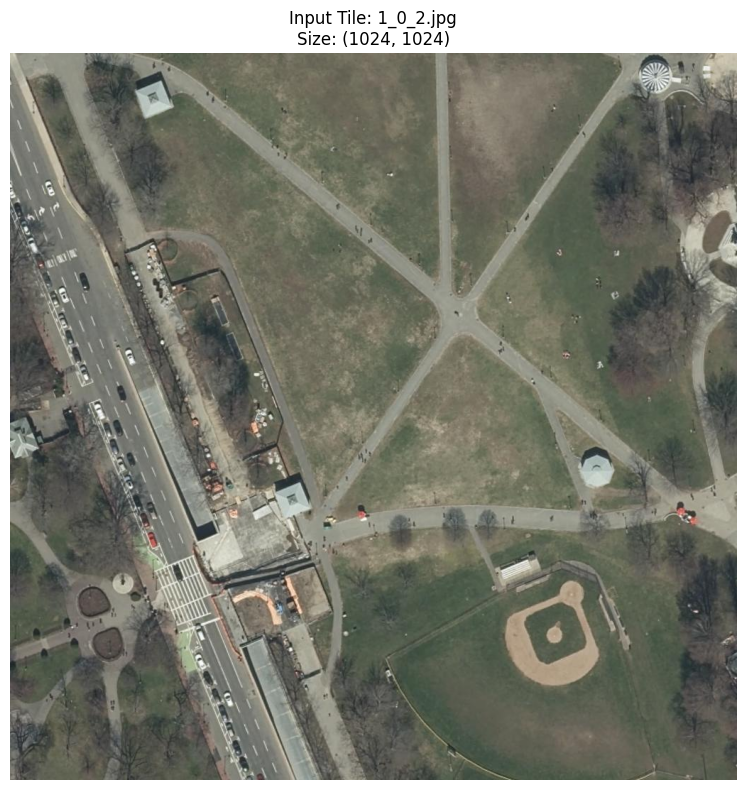

In [12]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from pathlib import Path

# Use stitched tiles (larger, better context)
stitched_dir = Path('/tmp/tile2net/example/tiles/stitched/256_19_4')
tile_path = list(stitched_dir.glob('*.jpg'))[0]

print(f"Loading: {tile_path}")

# Load image
img = Image.open(tile_path).convert('RGB')
img_array = np.array(img)

print(f"Image shape: {img_array.shape}")
print(f"Image size: {img.size}")

# Prepare for model (Tile2Net preprocessing)
img_normalized = img_array.astype(np.float32) / 255.0

transform = transforms.Compose([
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406],
                     std=[0.229, 0.224, 0.225])
])

input_tensor = transform(img).unsqueeze(0).cuda()
# input_tensor = transform(img).unsqueeze(0).cpu()
print(f"Input shape: {input_tensor.shape}")
print(f"Input range: [{input_tensor.min():.3f}, {input_tensor.max():.3f}]")

# Visualize
plt.figure(figsize=(8, 8))
plt.imshow(img)
plt.title(f"Input Tile: {tile_path.name}\nSize: {img.size}")
plt.axis('off')
plt.tight_layout()
plt.show()

In [13]:
  # Fix missing config values that are needed for inference
  from tile2net.namespace import torch_version_float

  # Set required config values
  cfg.OPTIONS.TORCH_VERSION = torch_version_float()
  cfg.MODEL.MSCALE = True  # MscaleOCR uses multi-scale
  cfg.MODEL.MSCALE_LO_SCALE = 0.5  # Default low-res scale

  print(f"Torch version: {cfg.OPTIONS.TORCH_VERSION}")
  print(f"Multi-scale enabled: {cfg.MODEL.MSCALE}")
  print(f"Low-res scale: {cfg.MODEL.MSCALE_LO_SCALE}")
  print("\n✓ Config fixed!")

Torch version: 2.6
Multi-scale enabled: True
Low-res scale: 0.5

✓ Config fixed!


Running inference...
Output shape: torch.Size([1, 4, 1024, 1024])


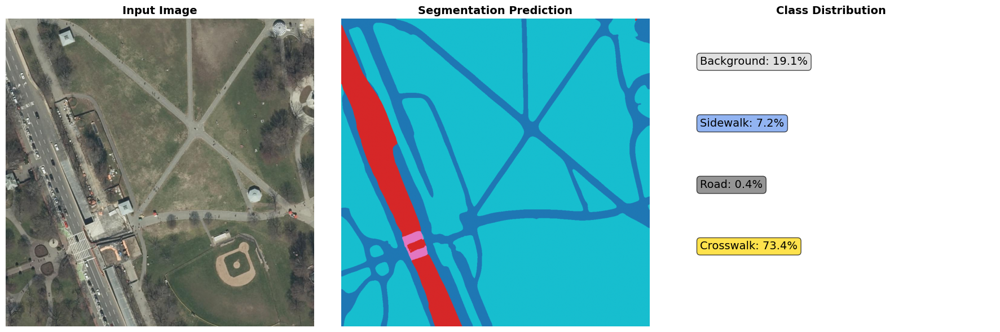


Inference complete!
Unique classes in prediction: [0 1 2 3]


In [14]:
# Run model
print("Running inference...")
with torch.no_grad():
  output = net({'images': input_tensor})

# Handle output
if isinstance(output, dict):
  pred_logits = output.get('pred', output.get('out', list(output.values())[0]))
else:
  pred_logits = output

print(f"Output shape: {pred_logits.shape}")

# Get prediction mask
pred_mask = pred_logits.argmax(dim=1).cpu().numpy()[0]

# Visualize
class_names = ['Background', 'Sidewalk', 'Road', 'Crosswalk']
class_colors = ['lightgray', 'cornflowerblue', 'dimgray', 'gold']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Input
axes[0].imshow(img)
axes[0].set_title('Input Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Prediction
im = axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].set_title('Segmentation Prediction', fontsize=14, fontweight='bold')
axes[1].axis('off')

# Stats
axes[2].axis('off')
axes[2].set_xlim(0, 1)
axes[2].set_ylim(0, 1)
for i in range(4):
  mask = pred_mask == i
  pct = mask.sum() / mask.size * 100
  axes[2].text(0.1, 0.85 - i*0.2,
              f"{class_names[i]}: {pct:.1f}%",
              fontsize=14,
              bbox=dict(boxstyle='round', facecolor=class_colors[i], alpha=0.7,
edgecolor='black'))
axes[2].set_title('Class Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

print("\nInference complete!")
print(f"Unique classes in prediction: {np.unique(pred_mask)}")

In [15]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget

# Inspect HRNet structure
print("=" * 70)
print("HRNet-W48 Backbone Structure for GradCAM")
print("=" * 70)

stage_info = {}
for name, module in net.backbone.named_children():
  if 'stage' in name or 'transition' in name:
      print(f"\n{name}: {type(module).__name__}")
      if hasattr(module, '__len__'):
          print(f"  Num blocks: {len(module)}")
          if 'stage' in name and hasattr(module[-1], 'branches'):
              num_branches = len(module[-1].branches)
              print(f"  Branches: {num_branches} (multi-resolution)")
              stage_info[name] = num_branches
              for i, branch in enumerate(module[-1].branches):
                  print(f"    Branch {i}: {len(branch)} blocks")

print("\n" + "=" * 70)
print("Recommended GradCAM Target Layers:")
print("=" * 70)
print("  stage2: 2 branches (high-res + low-res)")
print("  stage3: 3 branches (high + mid + low res)")
print("  stage4: 4 branches (multi-scale fusion)")
print("\nWe'll visualize how each stage focuses on different features!")
print("=" * 70)

HRNet-W48 Backbone Structure for GradCAM

transition1: ModuleList
  Num blocks: 2

stage2: Sequential
  Num blocks: 1
  Branches: 2 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks

transition2: ModuleList
  Num blocks: 3

stage3: Sequential
  Num blocks: 4
  Branches: 3 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks
    Branch 2: 4 blocks

transition3: ModuleList
  Num blocks: 4

stage4: Sequential
  Num blocks: 3
  Branches: 4 (multi-resolution)
    Branch 0: 4 blocks
    Branch 1: 4 blocks
    Branch 2: 4 blocks
    Branch 3: 4 blocks

Recommended GradCAM Target Layers:
  stage2: 2 branches (high-res + low-res)
  stage3: 3 branches (high + mid + low res)
  stage4: 4 branches (multi-scale fusion)

We'll visualize how each stage focuses on different features!


Generating GradCAM for class: Sidewalk
Class coverage: 7.2%
Processing Stage2-HighRes...
Processing Stage2-LowRes...
Processing Stage3-HighRes...
Processing Stage3-MidRes...
Processing Stage4-HighRes...
Processing Stage4-LowRes...


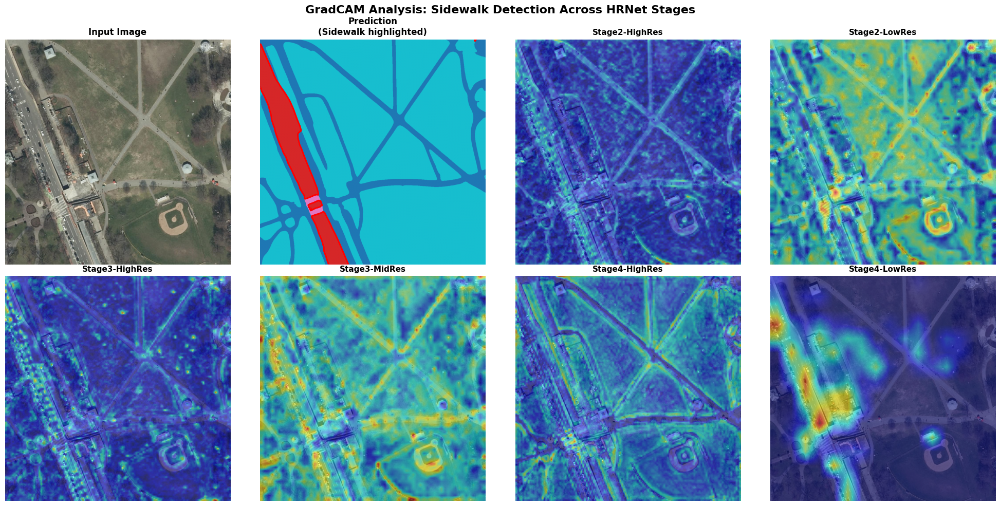


✓ GradCAM visualization complete!


In [16]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch.nn as nn

# Choose a class to explain (1=Sidewalk is usually interesting)
target_class = 1  # Sidewalk
class_mask = (pred_mask == target_class)

print(f"Generating GradCAM for class: {class_names[target_class]}")
print(f"Class coverage: {class_mask.sum() / class_mask.size * 100:.1f}%")

# Create a wrapper model that returns only the prediction tensor
class ModelWrapper(nn.Module):
  def __init__(self, model):
      super().__init__()
      self.model = model

  def forward(self, x):
      output = self.model({'images': x})
      # Return only the prediction logits (what GradCAM expects)
      if isinstance(output, dict):
          return output.get('pred', output.get('out', list(output.values())[0]))
      return output

wrapped_net = ModelWrapper(net)
wrapped_net.eval()

# Copy the backbone reference for GradCAM to access
wrapped_net.backbone = net.backbone

# Define target layers from different HRNet stages
target_layers_dict = {
  'Stage2-HighRes': [wrapped_net.backbone.stage2[-1].branches[0][-1]],
  'Stage2-LowRes': [wrapped_net.backbone.stage2[-1].branches[1][-1]],
  'Stage3-HighRes': [wrapped_net.backbone.stage3[-1].branches[0][-1]],
  'Stage3-MidRes': [wrapped_net.backbone.stage3[-1].branches[1][-1]],
  'Stage4-HighRes': [wrapped_net.backbone.stage4[-1].branches[0][-1]],
  'Stage4-LowRes': [wrapped_net.backbone.stage4[-1].branches[3][-1]],
}

# Prepare target for GradCAM
targets = [SemanticSegmentationTarget(target_class, class_mask)]

# Generate CAMs
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

# Original image
axes[0].imshow(img)
axes[0].set_title('Input Image', fontsize=12, fontweight='bold')
axes[0].axis('off')

# Prediction with target class highlighted
axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].contour(class_mask, colors='red', linewidths=2)
axes[1].set_title(f'Prediction\n({class_names[target_class]} highlighted)',
               fontsize=12, fontweight='bold')
axes[1].axis('off')

# Generate GradCAM for each layer
for idx, (name, layers) in enumerate(target_layers_dict.items(), start=2):
  print(f"Processing {name}...")

  try:
      cam = GradCAM(model=wrapped_net, target_layers=layers)
      grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

      # Overlay on image
      cam_image = show_cam_on_image(img_normalized, grayscale_cam, use_rgb=True)

      axes[idx].imshow(cam_image)
      axes[idx].set_title(f'{name}', fontsize=11, fontweight='bold')
      axes[idx].axis('off')

      # Clean up
      del cam

  except Exception as e:
      print(f"  Error: {type(e).__name__}: {e}")
      axes[idx].text(0.5, 0.5, f'Error:\n{type(e).__name__}',
                    ha='center', va='center', fontsize=10)
      axes[idx].axis('off')

plt.suptitle(f'GradCAM Analysis: {class_names[target_class]} Detection Across HRNet Stages',
           fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print("\n✓ GradCAM visualization complete!")

Generating Layer CAM for class: Sidewalk
Class coverage: 7.2%
Processing Stage2-MultiLayer...
Processing Stage3-MultiLayer...
Processing Stage4-MultiLayer...


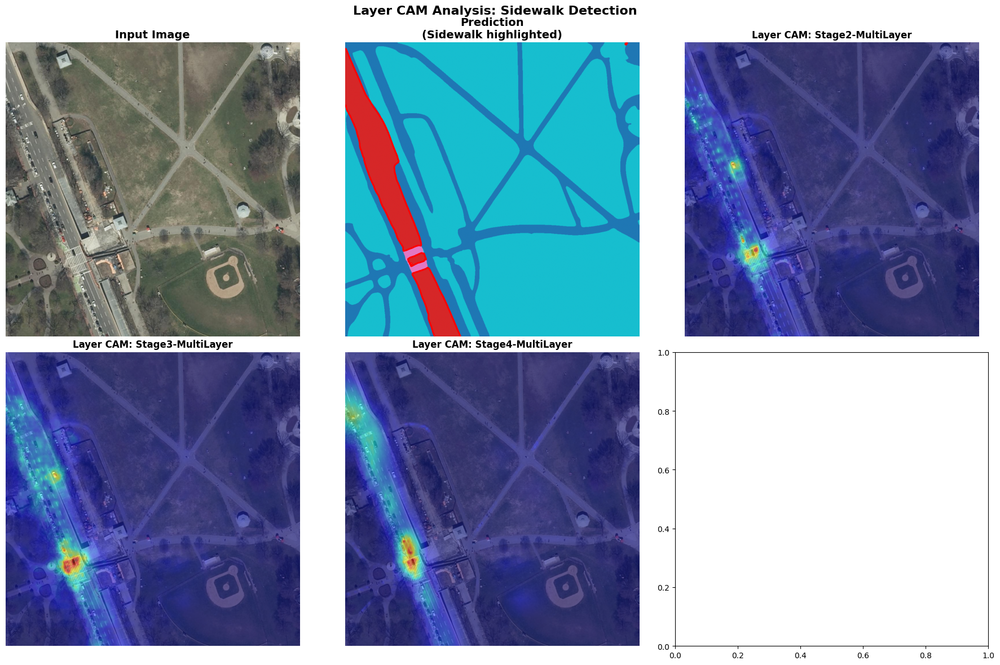


✓ Layer CAM visualization complete!


In [ ]:
# ============================================================================
# Layer CAM Visualization
# ============================================================================
# Layer CAM generates activation maps by aggregating gradients from multiple
# layers, providing more detailed spatial information than single-layer methods.

from pytorch_grad_cam import LayerCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch.nn as nn

# Choose a class to explain (1=Sidewalk)
target_class = 1  # Sidewalk
class_mask = (pred_mask == target_class)

print(f"Generating Layer CAM for class: {class_names[target_class]}")
print(f"Class coverage: {class_mask.sum() / class_mask.size * 100:.1f}%")

# Prepare target for Layer CAM
targets = [SemanticSegmentationTarget(target_class, class_mask)]

# Define target layers from different HRNet stages
# Layer CAM works well with multiple layers from the same stage
target_layers_dict = {
    'Stage2-MultiLayer': [
        wrapped_net.backbone.stage2[-1].branches[0][-1],
        wrapped_net.backbone.stage2[-1].branches[1][-1]
    ],
    'Stage3-MultiLayer': [
        wrapped_net.backbone.stage3[-1].branches[0][-1],
        wrapped_net.backbone.stage3[-1].branches[1][-1],
        wrapped_net.backbone.stage3[-1].branches[2][-1]
    ],
    'Stage4-MultiLayer': [
        wrapped_net.backbone.stage4[-1].branches[0][-1],
        wrapped_net.backbone.stage4[-1].branches[3][-1]
    ],
}

# Generate Layer CAMs
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Original image
axes[0].imshow(img)
axes[0].set_title('Input Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Prediction with target class highlighted
axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].contour(class_mask, colors='red', linewidths=2)
axes[1].set_title(f'Prediction\n({class_names[target_class]} highlighted)',
                  fontsize=14, fontweight='bold')
axes[1].axis('off')

# Generate Layer CAM for each layer group
for idx, (name, layers) in enumerate(target_layers_dict.items(), start=2):
    print(f"Processing {name}...")

    try:
        cam = LayerCAM(model=wrapped_net, target_layers=layers)
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

        # Overlay on image
        cam_image = show_cam_on_image(img_normalized, grayscale_cam, use_rgb=True)

        axes[idx].imshow(cam_image)
        axes[idx].set_title(f'Layer CAM: {name}', fontsize=12, fontweight='bold')
        axes[idx].axis('off')

        # Clean up
        del cam

    except Exception as e:
        print(f"  Error: {type(e).__name__}: {e}")
        axes[idx].text(0.5, 0.5, f'Error:\n{type(e).__name__}',
                      ha='center', va='center', fontsize=10)
        axes[idx].axis('off')

plt.suptitle(f'Layer CAM Analysis: {class_names[target_class]} Detection',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print("\n✓ Layer CAM visualization complete!")


Generating Score CAM for class: Sidewalk
Class coverage: 7.2%
Note: Score CAM is gradient-free but slower than gradient-based methods...
Resized input tensor for Score CAM: torch.Size([1, 3, 256, 256])
Processing Stage2-HighRes...


100%|██████████| 3/3 [00:01<00:00,  2.44it/s]


Processing Stage3-HighRes...


100%|██████████| 3/3 [00:01<00:00,  2.49it/s]


Processing Stage4-HighRes...


100%|██████████| 3/3 [00:01<00:00,  2.36it/s]


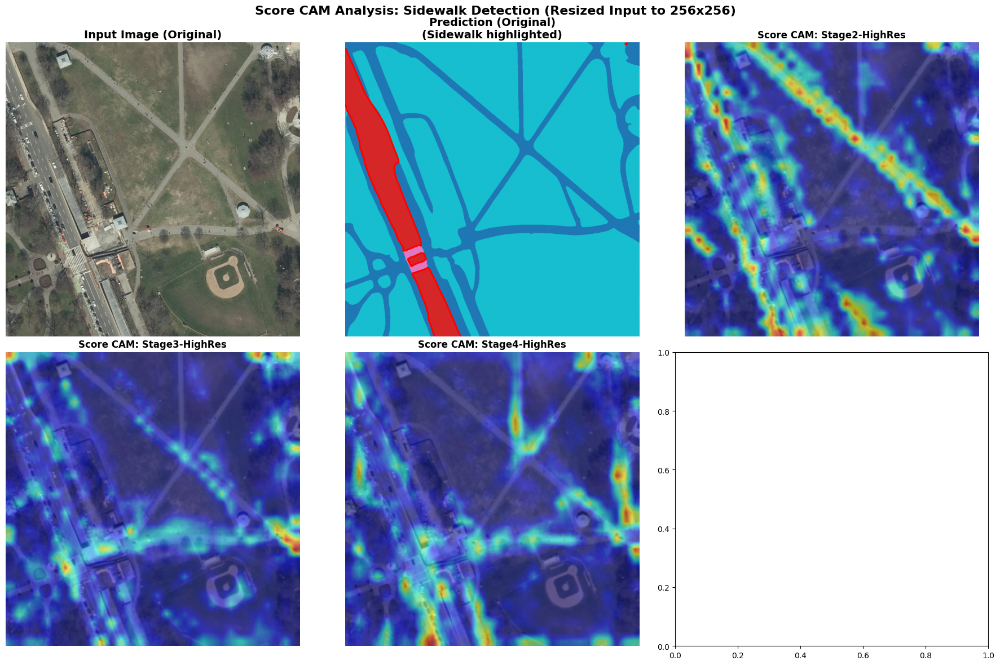


✓ Score CAM visualization complete!


In [ ]:
# ============================================================================
# Score CAM Visualization
# ============================================================================
# Score CAM is a gradient-free method that uses model confidence scores
# to generate activation maps, providing an alternative to gradient-based methods.

from pytorch_grad_cam import ScoreCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch.nn as nn
import gc
from torchvision import transforms
import numpy as np

# Choose a class to explain (1=Sidewalk)
target_class = 1  # Sidewalk
class_mask = (pred_mask == target_class)

print(f"Generating Score CAM for class: {class_names[target_class]}")
print(f"Class coverage: {class_mask.sum() / class_mask.size * 100:.1f}%")
print("Note: Score CAM is gradient-free but slower than gradient-based methods...")

# Clear CUDA cache before running Score CAM
torch.cuda.empty_cache()
gc.collect()

# Resize input image and mask for Score CAM to reduce memory usage
resize_dim = 256 # Reduced to 256x256
resize_transform = transforms.Resize((resize_dim, resize_dim), antialias=True)
resized_input_tensor = resize_transform(input_tensor)

# Resize the class_mask to match the resized input tensor dimensions
resized_class_mask_pil = transforms.ToPILImage()(class_mask.astype(np.uint8) * 255)
resized_class_mask = np.array(resize_transform(resized_class_mask_pil)) > 0

# Prepare target for Score CAM with the resized mask
targets = [SemanticSegmentationTarget(target_class, resized_class_mask)]

# Define target layers from different HRNet stages
# Score CAM works with single layers, we'll use high-res branches
target_layers_dict = {
    'Stage2-HighRes': [wrapped_net.backbone.stage2[-1].branches[0][-1]],
    'Stage3-HighRes': [wrapped_net.backbone.stage3[-1].branches[0][-1]],
    'Stage4-HighRes': [wrapped_net.backbone.stage4[-1].branches[0][-1]],
}

# Prepare resized image for overlay by working directly from the original PIL image
pil_original_image = img.copy() # 'img' is the original PIL image loaded earlier
resized_pil_image = resize_transform(pil_original_image)
resized_img_normalized = np.array(resized_pil_image).astype(np.float32) / 255.0


print(f"Resized input tensor for Score CAM: {resized_input_tensor.shape}")

# Generate Score CAMs
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Original image (display the original size for context)
axes[0].imshow(img)
axes[0].set_title('Input Image (Original)', fontsize=14, fontweight='bold')
axes[0].axis('off')

# Prediction with target class highlighted (display the original size for context)
axes[1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[1].contour(class_mask, colors='red', linewidths=2)
axes[1].set_title(f'Prediction (Original)\n({class_names[target_class]} highlighted)',
                  fontsize=14, fontweight='bold')
axes[1].axis('off')

# Generate Score CAM for each layer
for idx, (name, layers) in enumerate(target_layers_dict.items(), start=2):
    print(f"Processing {name}...")

    try:
        # Score CAM uses model confidence scores instead of gradients
        cam = ScoreCAM(model=wrapped_net, target_layers=layers)
        # Use the resized input tensor for Score CAM calculation
        grayscale_cam = cam(input_tensor=resized_input_tensor, targets=targets)[0]

        # Overlay on resized image for display
        cam_image = show_cam_on_image(resized_img_normalized, grayscale_cam, use_rgb=True)

        axes[idx].imshow(cam_image)
        axes[idx].set_title(f'Score CAM: {name}', fontsize=12, fontweight='bold')
        axes[idx].axis('off')

        # Clean up
        del cam

    except Exception as e:
        print(f"  Error: {type(e).__name__}: {e}")
        import traceback
        traceback.print_exc()
        axes[idx].text(0.5, 0.5, f'Error:\n{type(e).__name__}',
                      ha='center', va='center', fontsize=10)
        axes[idx].axis('off')

plt.suptitle(f'Score CAM Analysis: {class_names[target_class]} Detection (Resized Input to {resize_dim}x{resize_dim})',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print("\n✓ Score CAM visualization complete!")


Generating Integrated Gradients for class: Sidewalk
Class coverage: 7.2%
Computing Integrated Gradients on resized input (256x256)...


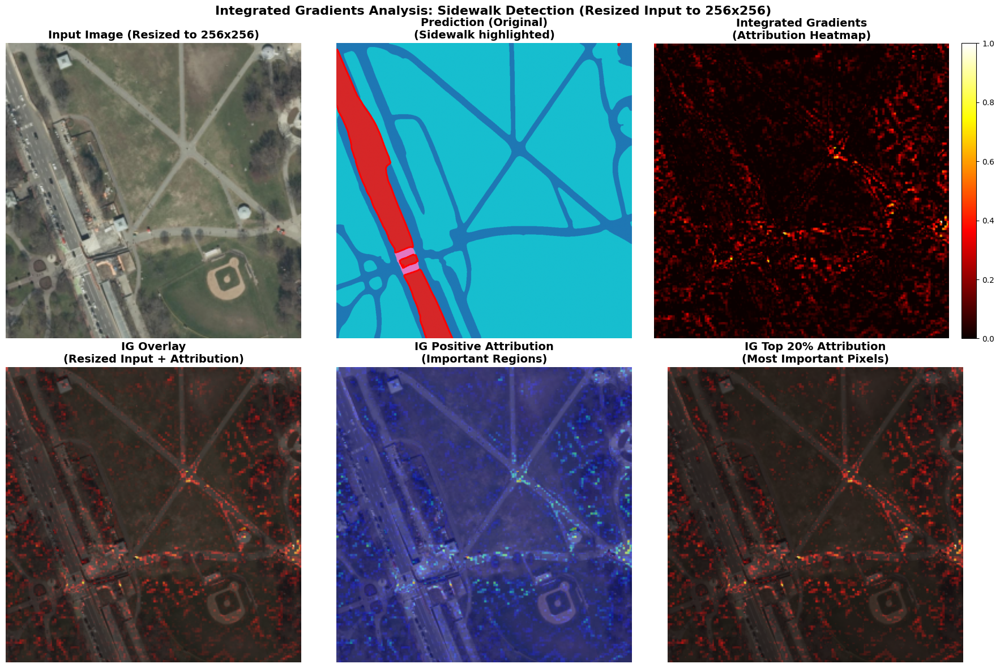


Attribution statistics:
  Min: 0.0000
  Max: 1.0000
  Mean: 0.0301
  Std: 0.0587

✓ Integrated Gradients visualization complete!


In [ ]:
# ============================================================================
# Integrated Gradients Visualization
# ============================================================================
# Integrated Gradients computes attributions by integrating gradients along
# a path from a baseline (e.g., black image) to the input, providing
# pixel-level importance scores.

# Install captum if needed
try:
    import captum
except ImportError:
    print("Installing captum...")
    %pip install captum -q
    import captum

from captum.attr import IntegratedGradients
from captum.attr import visualization as viz
import torch.nn.functional as F
from torchvision import transforms # Import transforms
import numpy as np

# Choose a class to explain (1=Sidewalk)
target_class = 1  # Sidewalk

print(f"Generating Integrated Gradients for class: {class_names[target_class]}")
print(f"Class coverage: {(pred_mask == target_class).sum() / pred_mask.size * 100:.1f}%")

# Create a wrapper for Integrated Gradients that outputs class-specific logits
class IGWrapper(nn.Module):
    def __init__(self, model, target_class):
        super().__init__()
        self.model = model
        self.target_class = target_class

    def forward(self, x):
        output = self.model({'images': x})
        if isinstance(output, dict):
            logits = output.get('pred', output.get('out', list(output.values())[0]))
        else:
            logits = output

        # Return sum of logits for the target class across spatial dimensions
        # This ensures a scalar output as required by IntegratedGradients when target=None
        return logits[:, self.target_class, :, :].sum(dim=(-1, -2))

ig_model = IGWrapper(net, target_class).eval()

# Resize input image and mask for Integrated Gradients to reduce memory usage
# Original image size is 1024x1024, let's try 256x256
resize_dim_ig = 256 # Reduced to 256x256 for IG
resize_transform_ig = transforms.Resize((resize_dim_ig, resize_dim_ig), antialias=True)
resized_input_tensor_ig = resize_transform_ig(input_tensor)

# Create baseline (black image with same normalization and resized dimensions)
baseline_ig = torch.zeros_like(resized_input_tensor_ig)

# Prepare resized image for overlay by working directly from the original PIL image
pil_original_image_ig = img.copy()
resized_pil_image_ig = resize_transform_ig(pil_original_image_ig)
resized_img_normalized_ig = np.array(resized_pil_image_ig).astype(np.float32) / 255.0


print(f"Computing Integrated Gradients on resized input ({resize_dim_ig}x{resize_dim_ig})...")

# Initialize Integrated Gradients
ig = IntegratedGradients(ig_model)

# Compute attributions
# Using n_steps=50 for good balance between accuracy and speed
attributions = ig.attribute(
    resized_input_tensor_ig,
    baselines=baseline_ig,
    target=None,  # Using class-specific wrapper instead which returns a scalar
    n_steps=50,
    internal_batch_size=1
)

# Convert to numpy for visualization
attributions_np = attributions.squeeze().cpu().detach().numpy()
# Sum across channels to get a single attribution map (if channels exist)
if len(attributions_np.shape) == 3: # Assuming attributions might come with channels
    attributions_np = np.sum(attributions_np, axis=0)

# Normalize attributions
attributions_np = np.maximum(attributions_np, 0)  # Remove negative values
if attributions_np.max() > 0:
    attributions_np = attributions_np / attributions_np.max()

# Visualize
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original image (display the resized version for consistency with attribution map)
axes[0, 0].imshow(resized_img_normalized_ig)
axes[0, 0].set_title(f'Input Image (Resized to {resize_dim_ig}x{resize_dim_ig})', fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

# Prediction with target class highlighted (original size for context, but note it's not on resized image)
axes[0, 1].imshow(pred_mask, cmap='tab10', vmin=0, vmax=3)
axes[0, 1].contour((pred_mask == target_class), colors='red', linewidths=2)
axes[0, 1].set_title(f'Prediction (Original)\n({class_names[target_class]} highlighted)',
                     fontsize=14, fontweight='bold')
axes[0, 1].axis('off')

# Integrated Gradients heatmap
im1 = axes[0, 2].imshow(attributions_np, cmap='hot', interpolation='bilinear')
axes[0, 2].set_title('Integrated Gradients\n(Attribution Heatmap)',
                     fontsize=14, fontweight='bold')
axes[0, 2].axis('off')
plt.colorbar(im1, ax=axes[0, 2], fraction=0.046, pad=0.04)

# Overlay on resized image
axes[1, 0].imshow(resized_img_normalized_ig)
axes[1, 0].imshow(attributions_np, cmap='hot', alpha=0.6, interpolation='bilinear')
axes[1, 0].set_title('IG Overlay\n(Resized Input + Attribution)',
                     fontsize=14, fontweight='bold')
axes[1, 0].axis('off')

# Positive attributions only (highlighting important regions)
positive_attr = np.maximum(attributions_np, 0)
axes[1, 1].imshow(resized_img_normalized_ig)
axes[1, 1].imshow(positive_attr, cmap='jet', alpha=0.5, interpolation='bilinear')
axes[1, 1].set_title('IG Positive Attribution\n(Important Regions)',
                     fontsize=14, fontweight='bold')
axes[1, 1].axis('off')

# Thresholded attribution (top 20% most important pixels)
threshold = np.percentile(attributions_np, 80)
thresholded_attr = attributions_np.copy()
thresholded_attr[thresholded_attr < threshold] = 0
axes[1, 2].imshow(resized_img_normalized_ig)
axes[1, 2].imshow(thresholded_attr, cmap='hot', alpha=0.7, interpolation='bilinear')
axes[1, 2].set_title('IG Top 20% Attribution\n(Most Important Pixels)',
                     fontsize=14, fontweight='bold')
axes[1, 2].axis('off')

plt.suptitle(f'Integrated Gradients Analysis: {class_names[target_class]} Detection (Resized Input to {resize_dim_ig}x{resize_dim_ig})',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

print(f"\nAttribution statistics:")
print(f"  Min: {attributions_np.min():.4f}")
print(f"  Max: {attributions_np.max():.4f}")
print(f"  Mean: {attributions_np.mean():.4f}")
print(f"  Std: {attributions_np.std():.4f}")
print(f"\n✓ Integrated Gradients visualization complete!")


## Confidence Map Visualization

Confidence maps represent the model's certainty about its predictions. For semantic segmentation, this typically means visualizing the per-pixel probability scores for each class. We'll use the `softmax` function to convert the model's output logits into a probability distribution over the classes for each pixel.

We will visualize:
1.  **Probability maps for each class**: Showing how confident the model is that a pixel belongs to a specific class.
2.  **Overall Confidence Map**: Displaying the probability of the *predicted* class for each pixel, giving a general sense of the model's confidence in its final segmentation across the image.

Probabilities shape: torch.Size([1, 4, 1024, 1024])
Probabilities range: [0.000, 1.000]


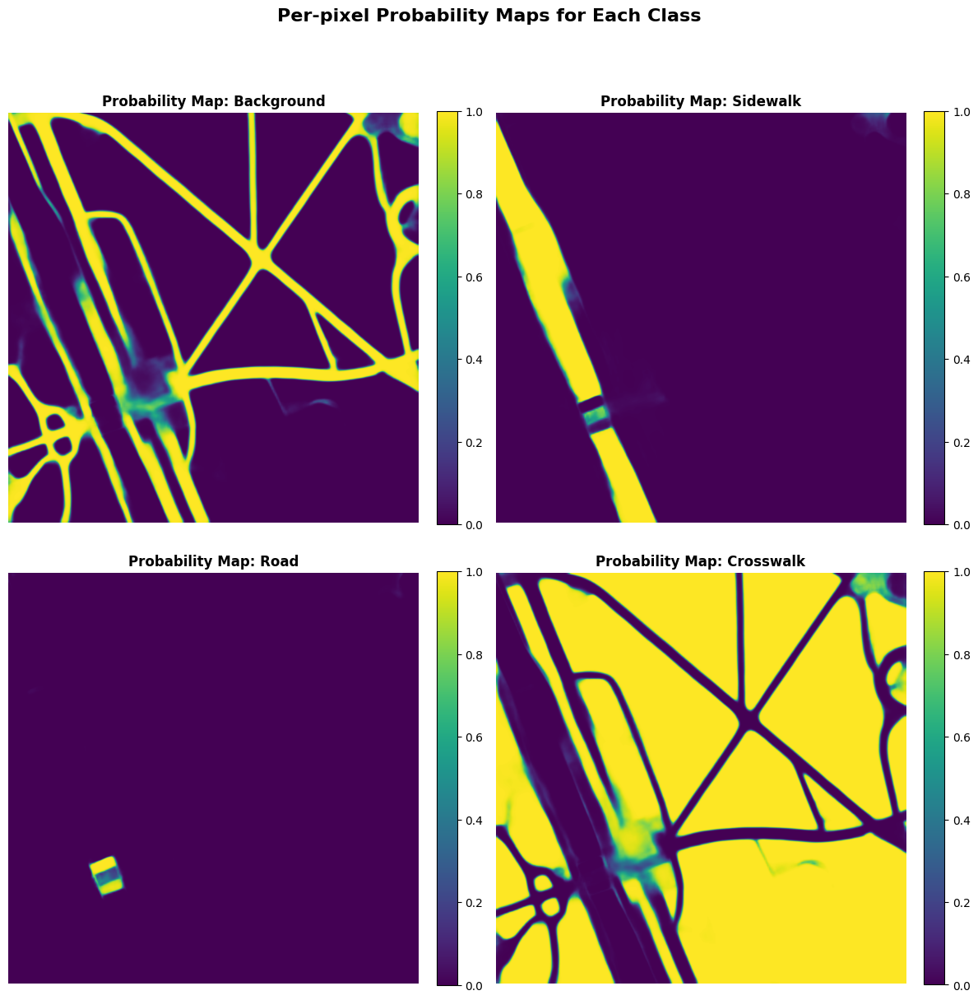

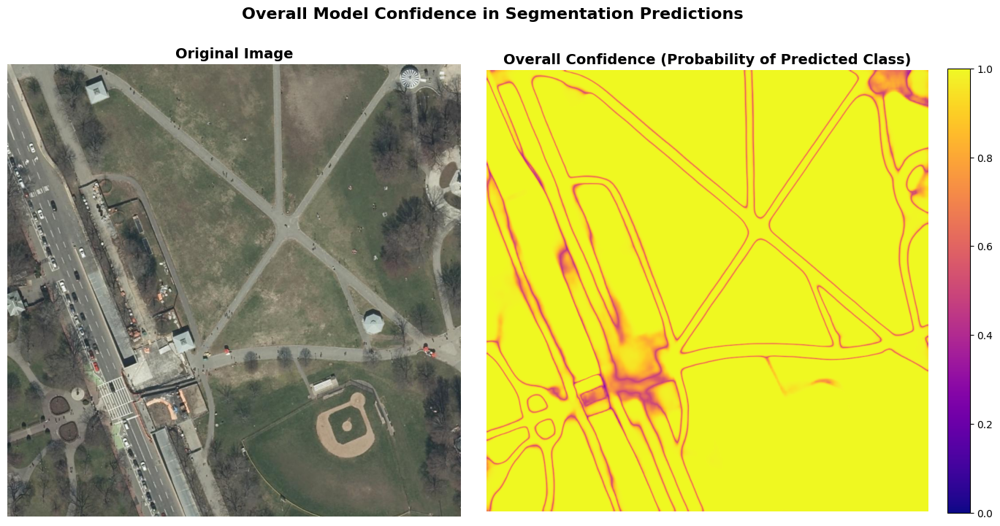


✓ Confidence map visualization complete!


In [20]:
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

# Ensure pred_logits is on CPU for visualization
pred_logits_cpu = pred_logits.cpu()

# Apply softmax to get per-pixel probabilities
# The output shape is (Batch_size, Num_classes, Height, Width)
probabilities = F.softmax(pred_logits_cpu, dim=1)

print(f"Probabilities shape: {probabilities.shape}")
print(f"Probabilities range: [{probabilities.min():.3f}, {probabilities.max():.3f}]")

# Visualize Probability Maps for each class
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for i, (ax, class_name, class_color) in enumerate(zip(axes, class_names, class_colors)):
    prob_map = probabilities[0, i, :, :].numpy()
    im = ax.imshow(prob_map, cmap='viridis', vmin=0, vmax=1)
    ax.set_title(f'Probability Map: {class_name}', fontsize=12, fontweight='bold', color='black')
    ax.axis('off')
    fig.colorbar(im, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)

plt.suptitle('Per-pixel Probability Maps for Each Class', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout to prevent title overlap
plt.show()

# Visualize Overall Confidence Map (Probability of the Predicted Class)

# Get the probabilities corresponding to the predicted class at each pixel
# pred_mask (from previous cell) contains the class index for each pixel
# probabilities has shape (1, 4, H, W)
h, w = pred_mask.shape
overall_confidence_map = probabilities[0, pred_mask.reshape(-1), np.arange(h*w) % h, np.arange(h*w) // h].reshape(h,w).numpy()

# Alternative way, potentially more straightforward:
# First, reshape pred_mask to match probability indexing: (H, W) -> (1, 1, H, W)
# Then, gather probabilities using pred_mask as indices along dimension 1
# This method needs to be careful with broadcasting or explicit indexing
# Let's use torch.gather for a robust approach
predicted_class_indices = torch.tensor(pred_mask).unsqueeze(0).unsqueeze(0) # (1, 1, H, W)
overall_confidence_map_gather = torch.gather(probabilities, 1, predicted_class_indices).squeeze().numpy()

fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(img)
axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
axes[0].axis('off')

im = axes[1].imshow(overall_confidence_map_gather, cmap='plasma', vmin=0, vmax=1)
axes[1].set_title('Overall Confidence (Probability of Predicted Class)', fontsize=14, fontweight='bold')
axes[1].axis('off')
fig.colorbar(im, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

plt.suptitle('Overall Model Confidence in Segmentation Predictions', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

print("\n✓ Confidence map visualization complete!")

## XRAI Implementation and Insights for Sidewalk Segmentation

This task involves implementing XRAI (eXplanation with Ranked Area Integrals) visualization using the `saliency` library to understand how the segmentation model identifies 'Sidewalk' regions in a given image.

The process includes:

1.  **Defining a Model Wrapper**: A Python class `XRAINetWrapperClassSpecific` will be created to adapt the pre-trained `MscaleOCR` segmentation model into a format compatible with the `saliency` library. This wrapper will take an input image (as a NumPy array), normalize it, pass it through the model, and return a scalar score representing the total probability of the 'Sidewalk' class across all pixels.
2.  **Initializing XRAI Analyzer**: The `XRAI` analyzer from the `saliency` library will be initialized with a callable function that uses the model wrapper.
3.  **Preparing Input Image**: The original image will be resized to 256x256 pixels for efficient computation of XRAI attributions.
4.  **Computing XRAI Attributions**: The `attribute` method of the `XRAI` analyzer will be called with the resized input image, generating an attribution map that highlights areas crucial for the model's 'Sidewalk' prediction.
5.  **Visualizing Results**:
    *   The resized input image will be displayed.
    *   The normalized XRAI attribution map will be shown, indicating both positive (contributing to 'Sidewalk') and negative (contradicting 'Sidewalk') influences.
    *   An overlay of only the positive XRAI attributions on the input image will highlight the regions most influential for the 'Sidewalk' prediction.
    *   A separate visualization will pinpoint the top 10% most important pixels for the 'Sidewalk' class according to XRAI.

**Expected Outcome**: The visualizations will reveal which visual features (e.g., texture, color, edges, geometric shapes) in the input image are most heavily weighted by the segmentation model when it classifies pixels as 'Sidewalk'. This provides a deeper insight into the model's decision-making process for semantic segmentation.

In [2]:
pip install saliency


  Using cached scipy-1.16.3-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (62 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.2/86.2 kB 4.6 MB/s eta 0:00:00
Using cached scipy-1.16.3-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (35.9 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.14.6 requires scipy<1.16.0,>=1.8.0, but you have scipy 1.16.3 which is incompatible.


In [3]:
from saliency.core import XRAI, IntegratedGradients

In [18]:
import torch
from tile2net.tileseg.network import mynn
from tile2net.tileseg.config import cfg

# Ensure cfg.OPTIONS exists
if not hasattr(cfg, "OPTIONS"):
    class Options:
        pass
    cfg.OPTIONS = Options()

# Set TORCH_VERSION explicitly
cfg.OPTIONS.TORCH_VERSION = float(torch.__version__[:3])  # e.g., 2.1 -> 2.1

print("Torch version set to:", cfg.OPTIONS.TORCH_VERSION)


Torch version set to: 2.6


INFO       init weights from normal distribution
INFO       loading pretrained model /content/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth
INFO       Trunk: hrnetv2


Generating XRAI for class: Sidewalk...


INFO       Computing IG...


Input image prepared with shape: (256, 256, 3)
Computing XRAI attributions...


INFO       Done with IG. Computing XRAI...


Raw XRAI attributions shape: (256, 256)


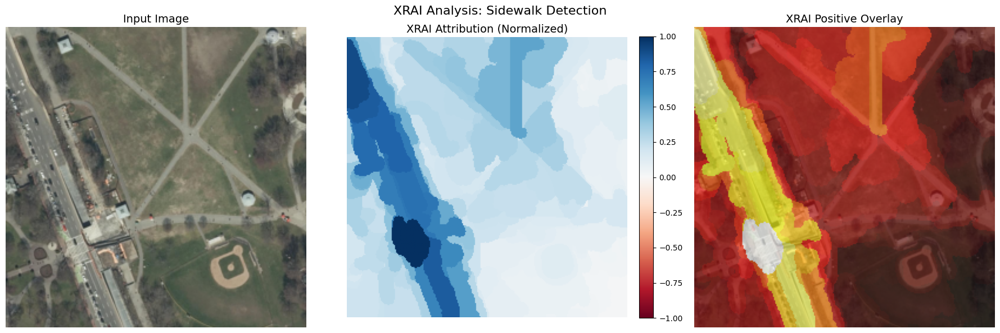

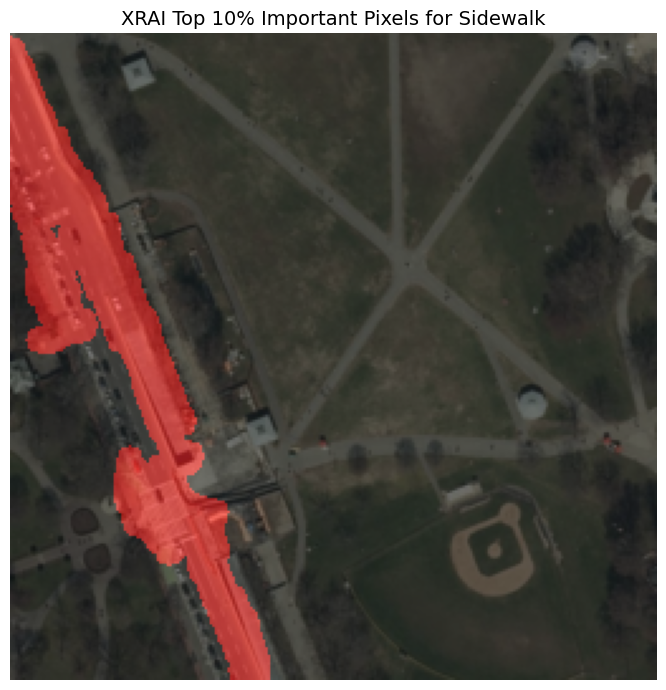

✓ XRAI visualization complete!


In [31]:
import torch
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import gc
import matplotlib.pyplot as plt
import sys
import os
from saliency.core import XRAI, IntegratedGradients
from PIL import Image
from pathlib import Path
from collections import OrderedDict

# -----------------------------
# Add your project path for tile2net
sys.path.insert(0, '/content/tile2net-segD/src')
from tile2net.tileseg.network.ocrnet import MscaleOCR
from tile2net.tileseg.config import cfg

# -----------------------------
# Paths for pretrained weights
HRNET_IMAGENET_CHECKPOINT = '/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/hrnetv2_w48_imagenet_pretrained.pth'
SEGMENTATION_CHECKPOINT = '/content/tile2net-segD/src/tile2net/raster/resources/assets/weights/satellite_2021.pth'

# Ensure directory exists
weights_dir = os.path.dirname(HRNET_IMAGENET_CHECKPOINT)
os.makedirs(weights_dir, exist_ok=True)

# -----------------------------
# Set model config
cfg.MODEL.ARCH = 'ocrnet.HRNet_Mscale'
cfg.DATASET.NUM_CLASSES = 4
cfg.MODEL.OCR.MID_CHANNELS = 512
cfg.MODEL.OCR.KEY_CHANNELS = 256
cfg.MODEL.BNFUNC = torch.nn.BatchNorm2d
cfg.MODEL.HRNET_CHECKPOINT = HRNET_IMAGENET_CHECKPOINT

# -----------------------------
# Instantiate model
net = MscaleOCR(num_classes=4, trunk='hrnetv2', criterion=None)

# Load segmentation weights
checkpoint = torch.load(SEGMENTATION_CHECKPOINT, map_location='cpu', weights_only=False)
state_dict = checkpoint['state_dict']
new_state_dict = OrderedDict()
for k, v in state_dict.items():
    name = k[7:] if k.startswith('module.') else k
    new_state_dict[name] = v
net.load_state_dict(new_state_dict)

# Move model to device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = net.to(device).eval()

# -----------------------------
# Class names
class_names = ['Background', 'Sidewalk', 'Road', 'Crosswalk']

# -----------------------------
# Load example image
stitched_dir = Path('/tmp/tile2net/example/tiles/stitched/256_19_4')
tile_path = list(stitched_dir.glob('*.jpg'))[0]
img = Image.open(tile_path).convert('RGB')

# -----------------------------
# Define normalization
original_normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

# -----------------------------
# Define XRAI wrapper class
class XRAINetWrapperClassSpecific(torch.nn.Module):
    def __init__(self, model, original_normalize, target_class_idx):
        super().__init__()
        self.model = model.to(device).eval()
        self.original_normalize = original_normalize
        self.target_class_idx = target_class_idx

    def forward(self, input_imgs_np):
        input_imgs_np = np.squeeze(input_imgs_np)
        if input_imgs_np.ndim == 3:
            input_imgs_np = np.expand_dims(input_imgs_np, 0)

        # Convert to tensor (B,C,H,W)
        input_tensor = torch.from_numpy(input_imgs_np).float().permute(0, 3, 1, 2)
        normalized_input = self.original_normalize(input_tensor).to(device)

        # Forward pass
        with torch.no_grad():
            output = self.model({'images': normalized_input})

        # Extract logits
        if isinstance(output, dict):
            logits = output.get('pred', output.get('out', list(output.values())[0]))
        else:
            logits = output

        # Softmax to get probabilities
        probs = F.softmax(logits, dim=1)

        # Get per-pixel probability map for target class
        target_probs = probs[:, self.target_class_idx, :, :]  # shape: (B,H,W)

        # Add channel dimension -> (B,H,W,1)
        target_probs_np = target_probs.unsqueeze(-1).cpu().numpy()
        # Repeat to match input channels (H,W,3)
        target_probs_np_rgb = np.repeat(target_probs_np, 3, axis=-1)

        # **Return a dict with expected key for XRAI**
        return {"INPUT_OUTPUT_GRADIENTS": target_probs_np_rgb}


# -----------------------------
# Choose class to explain
target_class = 1  # Sidewalk
print(f"Generating XRAI for class: {class_names[target_class]}...")

# Instantiate wrapper
model_wrapper_xrai = XRAINetWrapperClassSpecific(net, original_normalize, target_class)

# -----------------------------
# Define XRAI-compatible callable
def call_model_for_xrai(input_imgs_np, call_model_args=None, **kwargs):
    """
    Callable compatible with XRAI.
    """
    return model_wrapper_xrai.forward(input_imgs_np)

# -----------------------------
# Initialize XRAI
torch.cuda.empty_cache()
gc.collect()
xrai_analyzer = XRAI()

# -----------------------------
# Prepare input image
resize_dim_xrai = 256
resize_transform = transforms.Resize((resize_dim_xrai, resize_dim_xrai), antialias=True)
resized_img = resize_transform(img)
input_image = np.array(resized_img).astype(np.float32) / 255.0  # HWC, float [0,1]

print(f"Input image prepared with shape: {input_image.shape}")

# -----------------------------
# Compute XRAI attributions
print("Computing XRAI attributions...")
attributions_xrai = xrai_analyzer.GetMask(
    input_image,               # HWC or B,H,W,C
    call_model_for_xrai,       # callable
    call_model_args=None       # XRAI passes this internally
)

# Remove batch dim if present
attributions_xrai = np.squeeze(attributions_xrai)
print(f"Raw XRAI attributions shape: {attributions_xrai.shape}")

# -----------------------------
# Normalize attributions
max_abs = np.max(np.abs(attributions_xrai))
attributions_xrai_normalized = attributions_xrai / max_abs if max_abs > 0 else attributions_xrai

# -----------------------------
# Visualization
resized_img_np = np.array(resized_img).astype(np.float32) / 255.0

fig, axes = plt.subplots(1, 3, figsize=(18,6))
axes[0].imshow(resized_img_np)
axes[0].set_title("Input Image", fontsize=14)
axes[0].axis('off')

im1 = axes[1].imshow(attributions_xrai_normalized, cmap='RdBu', vmin=-1, vmax=1)
axes[1].set_title("XRAI Attribution (Normalized)", fontsize=14)
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Positive overlay
positive_attr = np.maximum(attributions_xrai, 0)
if positive_attr.max() > 0:
    positive_attr /= positive_attr.max()
axes[2].imshow(resized_img_np)
axes[2].imshow(positive_attr, cmap='hot', alpha=0.6)
axes[2].set_title("XRAI Positive Overlay", fontsize=14)
axes[2].axis('off')

plt.suptitle(f'XRAI Analysis: {class_names[target_class]} Detection', fontsize=16)
plt.tight_layout()
plt.show()

# -----------------------------
# Highlight top 10% important pixels
threshold = np.percentile(positive_attr.flatten(), 90)
important_mask = positive_attr >= threshold

plt.figure(figsize=(7,7))
plt.imshow(resized_img_np)
overlay = np.zeros_like(resized_img_np)
overlay[important_mask] = [1,0,0]  # red
plt.imshow(overlay, alpha=0.5)
plt.title(f'XRAI Top 10% Important Pixels for {class_names[target_class]}', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()

print("✓ XRAI visualization complete!")
